#  **Effect of Data Augmentation on Object detection using YOLOv8 & COCO Dataset**

#### 1. Installing YOLO Dependencies

This section ensures the necessary YOLO framework is installed by using the ultralytics library, which provides tools for training, validation, and inference with YOLOv8.

In [ ]:
! pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 59.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 119.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 88.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 105.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalli

#### 2. Importing Libraries

In [ ]:
import torch
import os
import shutil
import yaml
from IPython.display import Image, clear_output

#### 3. Preparing Data for Training

This section prepares the dataset for YOLO training by verifying paths and converting COCO annotations to the YOLO format.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
"""
Already created a subset of the COCO Dataset with 9 classes => [1,2,3,4,6,7,8,10,13]
person, bicycle, car,motorcycle ,bus ,train ,truck, traffic light, stop sign
Aimed for Autonomous vehicles and self driving cars projects. -> https://www.kaggle.com/datasets/abdelrahmanelgharibx/coco2017-subset
"""

zip_path = "/content/drive/MyDrive/coco_subset.zip"
extract_folder = "/content/coco_subsett"

import zipfile, os
os.makedirs(extract_folder, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder)

print("Extracted files:")
print(os.listdir(extract_folder))


Extracted files:
['annotations', 'images']


#### 3.1 Verify Dataset Structure

Checks the dataset's structure and confirms the availability of annotations and images.

In [ ]:
import os

base_path = "/content/coco_subsett"
print("Annotations:", os.listdir(os.path.join(base_path, "annotations")))
print("Training images:", len(os.listdir(os.path.join(base_path, "images/train2017"))))
print("Validation images:", len(os.listdir(os.path.join(base_path, "images/val2017"))))
# print("Test images:", len(os.listdir(os.path.join(base_path, "test2017"))))

Annotations: ['instances_train2017.json', 'instances_val2017.json']
Training images: 4278
Validation images: 715


#### 3.2 Convert COCO annotation to YOLO format

Converts bounding box annotations from the COCO format (used by the dataset) to the YOLO format.

In [ ]:
!pip install pycocotools


In [ ]:
import json
from pycocotools.coco import COCO
import os

train_annotation_path = "/content/coco_subsett/annotations/instances_train2017.json"
val_annotation_path = "/content/coco_subsett/annotations/instances_val2017.json"
train_images_dir = "/content/coco_subsett/images/train2017"
val_images_dir = "/content/coco_subsett/images/val2017"
output_labels_train_dir = "/content/working/dataset/labels/train"
output_labels_val_dir = "/content/working/dataset/labels/val"

os.makedirs(output_labels_train_dir, exist_ok=True)
os.makedirs(output_labels_val_dir, exist_ok=True)

nc = 9
def convert_bbox_to_yolo(image_width, image_height, bbox):
    x, y, w, h = bbox
    x_center = (x + w / 2) / image_width
    y_center = (y + h / 2) / image_height
    w = w / image_width
    h = h / image_height
    return x_center, y_center, w, h

def process_coco_annotations(annotation_path, output_labels_dir, images_dir):

    coco = COCO(annotation_path)

    for img_id in coco.getImgIds():
        img_info = coco.loadImgs([img_id])[0]
        img_filename = img_info['file_name']
        img_path = os.path.join(images_dir, img_filename)

        if not os.path.exists(img_path):
            #print(f"Warning: {img_filename} not found in {images_dir}")
            continue

        img_width, img_height = img_info['width'], img_info['height']

        annotations = coco.loadAnns(coco.getAnnIds(imgIds=[img_id]))

        label_file_path = os.path.join(output_labels_dir, f"{img_filename.split('.')[0]}.txt")
        with open(label_file_path, 'w') as label_file:
            seen_labels = set()
            for ann in annotations:
                if 'bbox' in ann:
                    bbox = convert_bbox_to_yolo(img_width, img_height, ann['bbox'])
                    class_id = ann['category_id'] - 1

                    if class_id >= nc:
                        # print(f"Warning: Class ID {class_id} in {img_filename} exceeds nc={nc}. Skipping this annotation.")
                        continue
                    label_str = f"{class_id} {' '.join(map(str, bbox))}\n"
                    if label_str not in seen_labels:
                        label_file.write(label_str)
                        seen_labels.add(label_str)
                    else:
                        print(f"Warning: Duplicate label found in {img_filename}. Skipping this annotation.")

# Process both training and validation annotations
process_coco_annotations(train_annotation_path, output_labels_train_dir, train_images_dir)
process_coco_annotations(val_annotation_path, output_labels_val_dir, val_images_dir)

loading annotations into memory...
Done (t=7.73s)
creating index...
index created!
loading annotations into memory...
Done (t=0.20s)
creating index...
index created!


#### 4. Creating Symbolic Links for Training and Validation Images

In [ ]:
import os

train_images_dir = "/content/coco_subsett/images/train2017"
val_images_dir = "/content/coco_subsett/images/val2017"
output_train_images_dir = "/content/working/dataset/images/train"
output_val_images_dir = "/content/working/dataset/images/val"

os.makedirs(output_train_images_dir, exist_ok=True)
os.makedirs(output_val_images_dir, exist_ok=True)

for img_filename in os.listdir(train_images_dir):
    img_path = os.path.join(train_images_dir, img_filename)
    symlink_path = os.path.join(output_train_images_dir, img_filename)
    if not os.path.exists(symlink_path):
        os.symlink(img_path, symlink_path)

for img_filename in os.listdir(val_images_dir):
    img_path = os.path.join(val_images_dir, img_filename)
    symlink_path = os.path.join(output_val_images_dir, img_filename)
    if not os.path.exists(symlink_path):
        os.symlink(img_path, symlink_path)


In [ ]:
print("Training images:", len(os.listdir("/content/working/dataset/images/train")))
print("Validation images:", len(os.listdir("/content/working/dataset/images/val")))

Training images: 4278
Validation images: 715


#### 5. Listing Classes in COCO Dataset

In [ ]:
import json
from pycocotools.coco import COCO
annotation_path = "/content/coco_subsett/annotations/instances_train2017.json"
coco = COCO(annotation_path)

categories = coco.loadCats(coco.getCatIds())
class_names = [category['name'] for category in categories]
print("Classes in COCO dataset:", class_names)

loading annotations into memory...
Done (t=7.53s)
creating index...
index created!
Classes in COCO dataset: ['person', 'bicycle', 'car', 'motorcycle', 'bus', 'train', 'truck', 'traffic light', 'stop sign']


## **FOR NON-AUGMENTED DATASET**

#### 6. Creating data.yaml for YOLOv8

In [ ]:
data_yaml = """
train: /content/working/dataset/images/train
val: /content/working/dataset/images/val
nc: 9  # Number of classes, which should be 80 for COCO dataset
names: ['person', 'bicycle', 'car', 'motorcycle', 'bus', 'train', 'truck', 'traffic light', 'stop sign']  # Class names
"""
with open('/content/working/dataset/data.yaml', 'w') as f:
    f.write(data_yaml)


#### 7. Model Training
This section trains the YOLOv8 model on the prepared dataset.
Alters the augmentation parameters so that the model doesnt use the default augmentations.

**Training Parameters**:
- **Epochs**: 10 (number of times the model sees the entire dataset).
- **Batch Size**: 16 (number of images processed together during training).
- **Image Size:** 640x640 (resized input image dimensions).


In [ ]:
from ultralytics import YOLO
model = YOLO('yolov8s.pt')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 21.5M/21.5M [00:00<00:00, 585MB/s]


In [ ]:
model.train(data='/content/working/dataset/data.yaml', epochs=5, batch=8, imgsz=640,
    # Disable augmentations
    augment=False,           # turn off YOLOv8's augment
    auto_augment=None,       # turn off AutoAugment
    erasing=0.0,

    hsv_h=0.0,
    hsv_s=0.0,
    hsv_v=0.0,
    degrees=0.0,
    translate=0.0,
    scale=0.0,
    shear=0.0,
    perspective=0.0,
    flipud=0.0,
    fliplr=0.0,
    mosaic=0.0,
    mixup=0.0,
    copy_paste=0.0
)

Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=None, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/working/dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.0, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=Tru

100%|██████████| 755k/755k [00:00<00:00, 89.8MB/s]

Overriding model.yaml nc=80 with nc=9

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

Model summary: 129 layers, 11,139,083 parameters, 11,139,067 gradients, 28.7 GFLOPs

Transferred 349/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 395MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2906.8±1449.6 MB/s, size: 212.7 KB)


train: Scanning /content/working/dataset/labels/train... 4278 images, 265 backgrounds, 0 corrupt: 100%|██████████| 4278/4278 [00:02<00:00, 1464.45it/s]


train: New cache created: /content/working/dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1440.7±1016.0 MB/s, size: 172.9 KB)


val: Scanning /content/working/dataset/labels/val... 715 images, 38 backgrounds, 0 corrupt: 100%|██████████| 715/715 [00:00<00:00, 1308.80it/s]

val: New cache created: /content/working/dataset/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.97G      1.235      1.679      1.177         51        640: 100%|██████████| 535/535 [00:50<00:00, 10.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:05<00:00,  7.62it/s]


                   all        715       4887      0.569      0.462      0.473      0.285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      2.85G      1.285      1.291      1.216         22        640: 100%|██████████| 535/535 [00:46<00:00, 11.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.07it/s]

                   all        715       4887      0.599      0.448      0.498      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.88G      1.225      1.162      1.183         30        640: 100%|██████████| 535/535 [00:46<00:00, 11.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.15it/s]

                   all        715       4887      0.617      0.486      0.528      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      2.92G      1.094     0.9744      1.107         68        640: 100%|██████████| 535/535 [00:46<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.25it/s]

                   all        715       4887      0.666      0.508      0.566      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      2.96G     0.9454     0.7666      1.025         38        640: 100%|██████████| 535/535 [00:45<00:00, 11.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.22it/s]

                   all        715       4887      0.694      0.535      0.596      0.393



5 epochs completed in 0.072 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,129,067 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00,  9.76it/s]


                   all        715       4887      0.691      0.538      0.596      0.393
                person        478       2597      0.719      0.581      0.666      0.414
               bicycle        119        249      0.652      0.382      0.456      0.243
                   car        302       1163      0.688      0.561       0.61      0.394
            motorcycle        119        284      0.707      0.517      0.595      0.341
                 train        134        213      0.743      0.678      0.722      0.563
                 truck        107        133      0.832      0.669      0.739      0.548
         traffic light        165        248      0.497      0.378      0.384       0.25
Speed: 0.1ms preprocess, 1.9ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cf809ba9150>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

#### 8. Model Validation
This section evaluates the trained YOLOv8 model on the validation dataset to measure its performance.

**Dataset**: Validation data is defined in the data.yaml file.

**Output**:
- Calculates key metrics such as mAP (mean Average Precision), precision, and recall.

In [ ]:
metrics = model.val(data='/content/working/dataset/data.yaml')
print("Validation Results:")
print(metrics)

Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,129,067 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2727.5±664.0 MB/s, size: 181.2 KB)


val: Scanning /content/working/dataset/labels/val.cache... 715 images, 38 backgrounds, 0 corrupt: 100%|██████████| 715/715 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:05<00:00, 15.82it/s]


                   all        715       4887      0.696      0.536      0.596      0.392
                person        478       2597      0.719       0.58      0.665      0.414
               bicycle        119        249      0.662      0.382      0.453      0.242
                   car        302       1163      0.693       0.56      0.613      0.395
            motorcycle        119        284      0.706      0.515      0.596      0.338
                 train        134        213      0.752      0.676      0.722      0.562
                 truck        107        133      0.839      0.668       0.74      0.548
         traffic light        165        248      0.497      0.371      0.381      0.249
Speed: 0.2ms preprocess, 3.5ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train2
Validation Results:
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5, 6, 7])
box: ultralytics.utils.metrics.Metric objec

#### 11. Testing YOLOv8 Model on Test Images
This section tests the YOLOv8 model on unseen images from the test dataset to evaluate its real-world performance.

- **Test Data Source**: First 30 images from the COCO 2017 test dataset.
- **Prediction Results**: The model's predictions are saved in the runs/detect/train5 directory.
- **Purpose**: To visualize how the trained model performs on untrained data.


In [ ]:
# test_images_path = '/kaggle/input/coco2017/test2017'
# test_images = os.listdir(test_images_path)[:30]
# test_images_full_paths = [os.path.join(test_images_path, img) for img in test_images]
# results = model.predict(source=test_images_full_paths, save=True, save_txt=False)

# from pathlib import Path

# output_dir = Path("/kaggle/working/detect")
# output_dir.mkdir(parents=True, exist_ok=True)
# print(f"Results saved in: {output_dir}")



In [ ]:
# model.export(format='torchscript', save_dir='/kaggle/working/saved_models')

## **FOR AUGMENTATION # 1:**

#### 1. Create Dataset with Augmentation & Combine with Non-augmented dataset

In [ ]:
import os
import cv2
import shutil
from glob import glob
from tqdm import tqdm
import albumentations as A

# === 1. Define paths ===
orig_img_dir = "/content/working/dataset/images/train"
orig_lbl_dir = "/content/working/dataset/labels/train"

aug_img_dir = "/content/working/dataset_aug/images/train"
aug_lbl_dir = "/content/working/dataset_aug/labels/train"

# Create target folders
os.makedirs(aug_img_dir, exist_ok=True)
os.makedirs(aug_lbl_dir, exist_ok=True)

"flip+color+rotate"
# === 2. Albumentations transform ===
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.2),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=10, p=0.5),
    A.Rotate(limit=10, p=0.4)
    # No normalization here to avoid saving issues
    ],
    bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

# Loop over images
image_paths = sorted(glob(f"{orig_img_dir}/*.jpg"))
for img_path in tqdm(image_paths):
    filename = os.path.basename(img_path)
    basename = os.path.splitext(filename)[0]
    img = cv2.imread(img_path)

    # Copy original image and label (non-augmented)
    shutil.copy(img_path, os.path.join(aug_img_dir, filename))
    label_path = os.path.join(orig_lbl_dir, basename + ".txt")
    shutil.copy(label_path, os.path.join(aug_lbl_dir, basename + ".txt"))

    # Load label (YOLO format)
    with open(label_path, 'r') as f:
        lines = f.readlines()

    bboxes = []
    class_labels = []
    for line in lines:
        cls, x, y, bw, bh = map(float, line.strip().split())
        bboxes.append([x, y, bw, bh])
        class_labels.append(int(cls))

    # If no boxes, skip augmentation (already copied original)
    if not bboxes:
        continue

    # Apply augmentation
    try:
        transformed = transform(image=img, bboxes=bboxes, class_labels=class_labels)
        transformed_img = transformed['image']
        transformed_bboxes = transformed['bboxes']
        transformed_classes = transformed['class_labels']
    except Exception as e:
        print(f"Skipping augmentation for {img_path} due to error: {e}")
        continue

    # Save augmented image with suffix '_aug'
    out_img_path = os.path.join(aug_img_dir, f"{basename}_aug.jpg")
    cv2.imwrite(out_img_path, transformed_img)

    # Save augmented label
    out_lbl_path = os.path.join(aug_lbl_dir, f"{basename}_aug.txt")
    with open(out_lbl_path, 'w') as f:
        for cls, bbox in zip(transformed_classes, transformed_bboxes):
            f.write(f"{cls} {' '.join(map(str, bbox))}\n")

# Copy validation data as is
!cp -r "/content/working/dataset/images/val" "/content/working/dataset_aug/images/"
!cp -r "/content/working/dataset/labels/val" "/content/working/dataset_aug/labels/"


/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
100%|██████████| 4278/4278 [00:39<00:00, 108.07it/s]


#### 1.1 Check the Images/Labels sizes

In [ ]:
print("Training images:", len(os.listdir("/content/working/dataset_aug/images/train")))
print("Training labels:", len(os.listdir("/content/working/dataset_aug/labels/train")))
print("Validation images:", len(os.listdir("/content/working/dataset_aug/images/val")))

Training images: 8291
Training labels: 8291
Validation images: 715


#### 2. Create new yaml file for Augmented Dataset

In [ ]:
data_yaml_aug = """
train: /content/working/dataset_aug/images/train
val: /content/working/dataset_aug/images/val
nc: 9
names: ['person', 'bicycle', 'car', 'motorcycle', 'bus', 'train', 'truck', 'traffic light', 'stop sign']
"""

with open("/content/working/dataset_aug/data.yaml", "w") as f:
    f.write(data_yaml_aug)


#### 3. Training Loop

In [ ]:
from ultralytics import YOLO

model2 = YOLO('yolov8s.pt')
model2.train(
    data='/content/working/dataset_aug/data.yaml',
    epochs=15,
    batch=8,
    imgsz=640,
    # Disable augmentations
    augment=False,           # turn off YOLOv8's augment
    auto_augment=None,       # turn off AutoAugment
    erasing=0.0,

    hsv_h=0.0,
    hsv_s=0.0,
    hsv_v=0.0,
    degrees=0.0,
    translate=0.0,
    scale=0.0,
    shear=0.0,
    perspective=0.0,
    flipud=0.0,
    fliplr=0.0,
    mosaic=0.0,
    mixup=0.0,
    copy_paste=0.0
)


Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=None, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/working/dataset_aug/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.0, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrain

train: Scanning /content/working/dataset_aug/labels/train... 8291 images, 268 backgrounds, 0 corrupt: 100%|██████████| 8291/8291 [00:05<00:00, 1458.50it/s]


train: New cache created: /content/working/dataset_aug/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 856.0±161.3 MB/s, size: 168.7 KB)


val: Scanning /content/working/dataset_aug/labels/val... 715 images, 38 backgrounds, 0 corrupt: 100%|██████████| 715/715 [00:00<00:00, 1283.52it/s]

val: New cache created: /content/working/dataset_aug/labels/val.cache


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train3
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15       2.1G      1.388      1.566      1.263         17        640: 100%|██████████| 1037/1037 [01:36<00:00, 10.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.08it/s]

                   all        715       4887      0.609      0.471      0.524      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      2.26G      1.432       1.34      1.303         25        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 10.95it/s]


                   all        715       4887      0.618      0.434      0.477      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      2.29G       1.41        1.3      1.295         25        640: 100%|██████████| 1037/1037 [01:28<00:00, 11.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 10.87it/s]

                   all        715       4887      0.591      0.444      0.485        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      2.33G      1.337      1.191      1.247         30        640: 100%|██████████| 1037/1037 [01:28<00:00, 11.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.06it/s]

                   all        715       4887      0.599      0.475      0.498      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      2.37G      1.244      1.051      1.191         12        640: 100%|██████████| 1037/1037 [01:28<00:00, 11.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.22it/s]

                   all        715       4887      0.648      0.465      0.535      0.326


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      2.44G      1.157     0.9313      1.137         40        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.08it/s]

                   all        715       4887      0.668      0.493       0.55      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      2.48G      1.068     0.8209      1.084         23        640: 100%|██████████| 1037/1037 [01:28<00:00, 11.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.14it/s]

                   all        715       4887      0.664      0.503      0.555      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      2.63G     0.9896     0.7425      1.042         29        640: 100%|██████████| 1037/1037 [01:28<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.33it/s]

                   all        715       4887       0.69      0.485      0.553      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      2.67G     0.9178     0.6601      1.004         14        640: 100%|██████████| 1037/1037 [01:28<00:00, 11.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.26it/s]

                   all        715       4887      0.689      0.492       0.56      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15       2.7G     0.8428     0.5909     0.9677         34        640: 100%|██████████| 1037/1037 [01:28<00:00, 11.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.55it/s]

                   all        715       4887      0.694      0.502      0.556      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      2.78G      0.772     0.5303     0.9378         22        640: 100%|██████████| 1037/1037 [01:28<00:00, 11.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.46it/s]

                   all        715       4887       0.66      0.513      0.562      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      2.82G     0.7115      0.485     0.9119         23        640: 100%|██████████| 1037/1037 [01:28<00:00, 11.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.52it/s]

                   all        715       4887      0.677      0.505      0.562      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      2.89G     0.6413     0.4364     0.8867         27        640: 100%|██████████| 1037/1037 [01:28<00:00, 11.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.49it/s]

                   all        715       4887      0.707      0.499      0.565      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      2.95G     0.5777     0.3949     0.8649         25        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.51it/s]

                   all        715       4887      0.705      0.498      0.568      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      3.03G     0.5275     0.3699     0.8512         16        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.40it/s]

                   all        715       4887      0.681      0.525      0.569      0.368



15 epochs completed in 0.392 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 22.5MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,129,067 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00,  9.59it/s]


                   all        715       4887      0.706      0.496      0.568      0.368
                person        478       2597      0.741      0.551      0.636      0.375
               bicycle        119        249      0.638      0.381      0.429       0.24
                   car        302       1163       0.74      0.524      0.585      0.369
            motorcycle        119        284      0.675        0.5      0.571       0.32
                 train        134        213       0.79      0.568      0.669      0.508
                 truck        107        133      0.869      0.617      0.736      0.526
         traffic light        165        248      0.486      0.335       0.35      0.237
Speed: 0.1ms preprocess, 2.0ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/train3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cf8147aa890>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

#### 4. Model Validation

In [ ]:
metrics2 = model2.val(data='/content/working/dataset_aug/data.yaml')
print("Validation Results:")
print(metrics2)

Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,129,067 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1161.8±588.7 MB/s, size: 197.3 KB)


val: Scanning /content/working/dataset_aug/labels/val.cache... 715 images, 38 backgrounds, 0 corrupt: 100%|██████████| 715/715 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:05<00:00, 17.88it/s]


                   all        715       4887      0.708      0.495      0.567      0.367
                person        478       2597      0.742      0.551      0.637      0.376
               bicycle        119        249       0.65      0.382       0.43      0.244
                   car        302       1163      0.741      0.524      0.586       0.37
            motorcycle        119        284      0.676        0.5      0.571       0.32
                 train        134        213      0.789      0.563      0.669      0.506
                 truck        107        133      0.869      0.617      0.734      0.526
         traffic light        165        248      0.486      0.331      0.341       0.23
Speed: 0.2ms preprocess, 2.2ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train32
Validation Results:
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5, 6, 7])
box: ultralytics.utils.metrics.Metric obje

## **FOR AUGMENTATION # 2:**

In [ ]:
import os
import cv2
import shutil
from glob import glob
from tqdm import tqdm
import albumentations as A

# === 1. Define paths ===
orig_img_dir = "/content/working/dataset/images/train"
orig_lbl_dir = "/content/working/dataset/labels/train"

aug_img_dir = "/content/working/dataset_aug_2/images/train"
aug_lbl_dir = "/content/working/dataset_aug_2/labels/train"

# Create target folders
os.makedirs(aug_img_dir, exist_ok=True)
os.makedirs(aug_lbl_dir, exist_ok=True)

"noise+blur+hue"
transform = A.Compose([
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.4),                     # Add Gaussian noise to the image
    A.MedianBlur(blur_limit=5, p=0.3),                               # Apply median blur (e.g., simulating poor image quality)
    A.HueSaturationValue(hue_shift_limit=15, sat_shift_limit=20,
                         val_shift_limit=15, p=0.5)],                 # Randomly alter hue/saturation/value
    bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))


# Loop over images
image_paths = sorted(glob(f"{orig_img_dir}/*.jpg"))
for img_path in tqdm(image_paths):
    filename = os.path.basename(img_path)
    basename = os.path.splitext(filename)[0]
    img = cv2.imread(img_path)

    # Copy original image and label (non-augmented)
    shutil.copy(img_path, os.path.join(aug_img_dir, filename))
    label_path = os.path.join(orig_lbl_dir, basename + ".txt")
    shutil.copy(label_path, os.path.join(aug_lbl_dir, basename + ".txt"))

    # Load label (YOLO format)
    with open(label_path, 'r') as f:
        lines = f.readlines()

    bboxes = []
    class_labels = []
    for line in lines:
        cls, x, y, bw, bh = map(float, line.strip().split())
        bboxes.append([x, y, bw, bh])
        class_labels.append(int(cls))

    # If no boxes, skip augmentation (already copied original)
    if not bboxes:
        continue

    # Apply augmentation
    try:
        transformed = transform(image=img, bboxes=bboxes, class_labels=class_labels)
        transformed_img = transformed['image']
        transformed_bboxes = transformed['bboxes']
        transformed_classes = transformed['class_labels']
    except Exception as e:
        print(f"Skipping augmentation for {img_path} due to error: {e}")
        continue

    # Save augmented image with suffix '_aug'
    out_img_path = os.path.join(aug_img_dir, f"{basename}_aug.jpg")
    cv2.imwrite(out_img_path, transformed_img)

    # Save augmented label
    out_lbl_path = os.path.join(aug_lbl_dir, f"{basename}_aug.txt")
    with open(out_lbl_path, 'w') as f:
        for cls, bbox in zip(transformed_classes, transformed_bboxes):
            f.write(f"{cls} {' '.join(map(str, bbox))}\n")

# Copy validation data as is
!cp -r "/content/working/dataset/images/val" "/content/working/dataset_aug_2/images/"
!cp -r "/content/working/dataset/labels/val" "/content/working/dataset_aug_2/labels/"


/tmp/ipython-input-27-1625351346.py:21: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.4),                     # Add Gaussian noise to the image
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()
100%|██████████| 4278/4278 [00:57<00:00, 74.30it/s]


In [ ]:
print("Training images:", len(os.listdir("/content/working/dataset_aug_2/images/train")))
print("Training labels:", len(os.listdir("/content/working/dataset_aug_2/labels/train")))
print("Validation images:", len(os.listdir("/content/working/dataset_aug_2/images/val")))

Training images: 8291
Training labels: 8291
Validation images: 715


In [ ]:
data_yaml_aug_2 = """
train: /content/working/dataset_aug_2/images/train
val: /content/working/dataset_aug_2/images/val
nc: 9
names: ['person', 'bicycle', 'car', 'motorcycle', 'bus', 'train', 'truck', 'traffic light', 'stop sign']
"""

with open("/content/working/dataset_aug_2/data.yaml", "w") as f:
    f.write(data_yaml_aug_2)


In [ ]:
from ultralytics import YOLO

model3 = YOLO('yolov8s.pt')
model3.train(
    data='/content/working/dataset_aug_2/data.yaml',
    epochs=15,
    batch=8,
    imgsz=640,
    # Disable augmentations
    augment=False,           # turn off YOLOv8's augment
    auto_augment=None,       # turn off AutoAugment
    erasing=0.0,

    hsv_h=0.0,
    hsv_s=0.0,
    hsv_v=0.0,
    degrees=0.0,
    translate=0.0,
    scale=0.0,
    shear=0.0,
    perspective=0.0,
    flipud=0.0,
    fliplr=0.0,
    mosaic=0.0,
    mixup=0.0,
    copy_paste=0.0
)

Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=None, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/working/dataset_aug_2/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.0, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretra

train: Scanning /content/working/dataset_aug_2/labels/train... 8291 images, 265 backgrounds, 0 corrupt: 100%|██████████| 8291/8291 [00:05<00:00, 1463.15it/s]


train: New cache created: /content/working/dataset_aug_2/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 611.2±46.4 MB/s, size: 168.7 KB)


val: Scanning /content/working/dataset_aug_2/labels/val... 715 images, 38 backgrounds, 0 corrupt: 100%|██████████| 715/715 [00:00<00:00, 1241.61it/s]

val: New cache created: /content/working/dataset_aug_2/labels/val.cache


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train4
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      2.44G      1.324      1.686       1.24         17        640: 100%|██████████| 1037/1037 [01:37<00:00, 10.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 10.67it/s]

                   all        715       4887      0.598      0.474      0.513      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      2.55G      1.374      1.402      1.279         25        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 10.92it/s]

                   all        715       4887      0.617      0.412      0.468      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      2.57G      1.353      1.336      1.266         25        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 10.85it/s]

                   all        715       4887      0.613      0.458      0.505      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      2.61G      1.266      1.202      1.211         31        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.10it/s]

                   all        715       4887      0.615      0.467      0.495      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      2.65G      1.158      1.042      1.143         12        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.20it/s]

                   all        715       4887       0.62      0.478      0.526      0.325


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      2.67G      1.056     0.8984      1.082         40        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.01it/s]

                   all        715       4887      0.624      0.468       0.51      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      2.76G     0.9595     0.7767       1.03         23        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.17it/s]

                   all        715       4887      0.652      0.475      0.526      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      2.84G     0.8754     0.6809     0.9842         29        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.46it/s]

                   all        715       4887      0.649      0.477      0.524      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      2.91G     0.7969     0.5983     0.9484         14        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.35it/s]

                   all        715       4887      0.659      0.465      0.525      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      2.95G     0.7204     0.5237     0.9144         34        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.29it/s]

                   all        715       4887      0.621      0.501      0.531      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      3.02G     0.6551     0.4709     0.8898         22        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.45it/s]

                   all        715       4887      0.661      0.495      0.535       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      3.17G     0.5968     0.4252     0.8691         23        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.55it/s]

                   all        715       4887      0.651       0.49      0.541      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      3.21G     0.5304     0.3787     0.8484         27        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.55it/s]

                   all        715       4887       0.67       0.48      0.533       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      3.23G      0.475      0.341      0.833         25        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.52it/s]

                   all        715       4887       0.67      0.487       0.54       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      3.28G     0.4318     0.3181      0.824         16        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.45it/s]

                   all        715       4887      0.661      0.491      0.538      0.346



15 epochs completed in 0.394 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 22.5MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,129,067 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00,  9.99it/s]


                   all        715       4887      0.669      0.486       0.54      0.349
                person        478       2597      0.688      0.545        0.6      0.354
               bicycle        119        249      0.614      0.364      0.397      0.213
                   car        302       1163      0.602      0.548      0.557       0.35
            motorcycle        119        284      0.679      0.489       0.57      0.305
                 train        134        213      0.792       0.54      0.649      0.517
                 truck        107        133       0.85      0.598      0.694      0.509
         traffic light        165        248      0.459      0.319      0.314      0.196
Speed: 0.1ms preprocess, 2.1ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train4


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cf88b56a890>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

In [ ]:
metrics3 = model3.val(data='/content/working/dataset_aug_2/data.yaml')
print("Validation Results:")
print(metrics3)

Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,129,067 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2052.8±773.4 MB/s, size: 197.3 KB)


val: Scanning /content/working/dataset_aug_2/labels/val.cache... 715 images, 38 backgrounds, 0 corrupt: 100%|██████████| 715/715 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:04<00:00, 18.23it/s]


                   all        715       4887      0.672      0.483       0.54      0.349
                person        478       2597      0.693      0.541      0.599      0.354
               bicycle        119        249      0.609      0.357      0.397       0.21
                   car        302       1163      0.605      0.545      0.555      0.349
            motorcycle        119        284      0.684      0.489      0.571      0.303
                 train        134        213      0.795       0.54      0.646      0.516
                 truck        107        133      0.859      0.598      0.696       0.51
         traffic light        165        248      0.457       0.31      0.315      0.197
Speed: 0.3ms preprocess, 2.4ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train42
Validation Results:
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5, 6, 7])
box: ultralytics.utils.metrics.Metric obje

## **FOR AUGMENTATION # 3:**

In [ ]:
import os
import cv2
import shutil
from glob import glob
from tqdm import tqdm
import albumentations as A
from albumentations import CoarseDropout

# === 1. Define paths ===
orig_img_dir = "/content/working/dataset/images/train"
orig_lbl_dir = "/content/working/dataset/labels/train"

aug_img_dir = "/content/working/dataset_aug_3/images/train"
aug_lbl_dir = "/content/working/dataset_aug_3/labels/train"

# Create target folders
os.makedirs(aug_img_dir, exist_ok=True)
os.makedirs(aug_lbl_dir, exist_ok=True)


"flip+blur+contrast+shift/scale/rotate+cutout"
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.GaussianBlur(p=0.1),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=5, p=0.3),
    CoarseDropout(max_holes=5, max_height=16, max_width=16, fill_value=0, p=0.2),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))


# Loop over images
image_paths = sorted(glob(f"{orig_img_dir}/*.jpg"))
for img_path in tqdm(image_paths):
    filename = os.path.basename(img_path)
    basename = os.path.splitext(filename)[0]
    img = cv2.imread(img_path)

    # Copy original image and label (non-augmented)
    shutil.copy(img_path, os.path.join(aug_img_dir, filename))
    label_path = os.path.join(orig_lbl_dir, basename + ".txt")
    shutil.copy(label_path, os.path.join(aug_lbl_dir, basename + ".txt"))

    # Load label (YOLO format)
    with open(label_path, 'r') as f:
        lines = f.readlines()

    bboxes = []
    class_labels = []
    for line in lines:
        cls, x, y, bw, bh = map(float, line.strip().split())
        bboxes.append([x, y, bw, bh])
        class_labels.append(int(cls))

    # If no boxes, skip augmentation (already copied original)
    if not bboxes:
        continue

    # Apply augmentation
    try:
        transformed = transform(image=img, bboxes=bboxes, class_labels=class_labels)
        transformed_img = transformed['image']
        transformed_bboxes = transformed['bboxes']
        transformed_classes = transformed['class_labels']
    except Exception as e:
        print(f"Skipping augmentation for {img_path} due to error: {e}")
        continue

    # Save augmented image with suffix '_aug'
    out_img_path = os.path.join(aug_img_dir, f"{basename}_aug.jpg")
    cv2.imwrite(out_img_path, transformed_img)

    # Save augmented label
    out_lbl_path = os.path.join(aug_lbl_dir, f"{basename}_aug.txt")
    with open(out_lbl_path, 'w') as f:
        for cls, bbox in zip(transformed_classes, transformed_bboxes):
            f.write(f"{cls} {' '.join(map(str, bbox))}\n")

# Copy validation data as is
!cp -r "/content/working/dataset/images/val" "/content/working/dataset_aug_3/images/"
!cp -r "/content/working/dataset/labels/val" "/content/working/dataset_aug_3/labels/"


/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipython-input-34-253377903.py:27: UserWarning: Argument(s) 'max_holes, max_height, max_width, fill_value' are not valid for transform CoarseDropout
  CoarseDropout(max_holes=5, max_height=16, max_width=16, fill_value=0, p=0.2),
 78%|███████▊  | 3357/4278 [00:28<00:07, 121.32it/s]/usr/local/lib/python3.11/dist-packages/albumentations/augmentations/dropout/functional.py:559: RuntimeWarning: invalid value encountered in divide
  visibility_ratios = remaining_areas / box_areas
100%|██████████| 4278/4278 [00:35<00:00, 119.07it/s]


In [ ]:
print("Training images:", len(os.listdir("/content/working/dataset_aug_3/images/train")))
print("Training labels:", len(os.listdir("/content/working/dataset_aug_3/labels/train")))
print("Validation images:", len(os.listdir("/content/working/dataset_aug_3/images/val")))

Training images: 8291
Training labels: 8291
Validation images: 715


In [ ]:
data_yaml_aug_3 = """
train: /content/working/dataset_aug_3/images/train
val: /content/working/dataset_aug_3/images/val
nc: 9
names: ['person', 'bicycle', 'car', 'motorcycle', 'bus', 'train', 'truck', 'traffic light', 'stop sign']
"""

with open("/content/working/dataset_aug_3/data.yaml", "w") as f:
    f.write(data_yaml_aug_3)


In [ ]:
from ultralytics import YOLO

model4 = YOLO('yolov8s.pt')
model4.train(
    data='/content/working/dataset_aug_3/data.yaml',
    epochs=15,
    batch=8,
    imgsz=640,
    # Disable augmentations
    augment=False,           # turn off YOLOv8's augment
    auto_augment=None,       # turn off AutoAugment
    erasing=0.0,

    hsv_h=0.0,
    hsv_s=0.0,
    hsv_v=0.0,
    degrees=0.0,
    translate=0.0,
    scale=0.0,
    shear=0.0,
    perspective=0.0,
    flipud=0.0,
    fliplr=0.0,
    mosaic=0.0,
    mixup=0.0,
    copy_paste=0.0
)

Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=None, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/working/dataset_aug_3/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.0, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretra

train: Scanning /content/working/dataset_aug_3/labels/train... 8291 images, 266 backgrounds, 0 corrupt: 100%|██████████| 8291/8291 [00:05<00:00, 1452.37it/s]


train: New cache created: /content/working/dataset_aug_3/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 747.1±72.9 MB/s, size: 168.7 KB)


val: Scanning /content/working/dataset_aug_3/labels/val... 715 images, 38 backgrounds, 0 corrupt: 100%|██████████| 715/715 [00:00<00:00, 1224.94it/s]

val: New cache created: /content/working/dataset_aug_3/labels/val.cache


Plotting labels to runs/detect/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train5
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      2.77G      1.258      1.518       1.19         17        640: 100%|██████████| 1037/1037 [01:38<00:00, 10.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 10.52it/s]

                   all        715       4887       0.58      0.453      0.497      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      2.98G      1.336      1.293      1.244         25        640: 100%|██████████| 1037/1037 [01:31<00:00, 11.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 10.53it/s]

                   all        715       4887      0.607       0.45      0.498       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      2.98G      1.325       1.25      1.242         25        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.03it/s]

                   all        715       4887      0.613       0.48      0.509      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      2.98G      1.262      1.141      1.201         31        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 10.78it/s]

                   all        715       4887      0.617       0.48      0.506      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15         3G      1.166       1.01      1.141         12        640: 100%|██████████| 1037/1037 [01:29<00:00, 11.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.10it/s]

                   all        715       4887      0.655      0.491       0.54       0.34


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      3.03G      1.081      0.885       1.09         40        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 10.78it/s]

                   all        715       4887      0.641        0.5      0.549       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      3.07G     0.9966     0.7747      1.044         23        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.11it/s]

                   all        715       4887       0.63      0.513      0.559      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      3.11G     0.9163     0.6904      1.002         29        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.32it/s]

                   all        715       4887      0.647      0.509      0.553       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      3.14G     0.8434     0.6078     0.9669         14        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.37it/s]

                   all        715       4887      0.673      0.502      0.564      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      3.22G     0.7754     0.5443     0.9361         34        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.41it/s]

                   all        715       4887      0.684      0.513      0.566      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15       3.3G     0.7062     0.4899     0.9088         22        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.04it/s]

                   all        715       4887      0.665      0.528      0.559       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      3.33G     0.6538     0.4494     0.8878         23        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.12it/s]

                   all        715       4887      0.689      0.517       0.57      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15       3.4G     0.5909     0.4055      0.868         27        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00, 11.23it/s]

                   all        715       4887        0.7      0.508      0.569      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      3.46G     0.5295     0.3662     0.8485         25        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.52it/s]

                   all        715       4887      0.713      0.517      0.576      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      3.55G     0.4845     0.3427     0.8383         16        640: 100%|██████████| 1037/1037 [01:30<00:00, 11.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:03<00:00, 11.39it/s]

                   all        715       4887      0.689      0.527      0.571      0.371



15 epochs completed in 0.398 hours.
Optimizer stripped from runs/detect/train5/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train5/weights/best.pt, 22.5MB

Validating runs/detect/train5/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,129,067 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 45/45 [00:04<00:00,  9.62it/s]


                   all        715       4887      0.712      0.519      0.576      0.372
                person        478       2597      0.724       0.55      0.616      0.366
               bicycle        119        249      0.692      0.396      0.431      0.229
                   car        302       1163      0.727      0.543      0.597      0.378
            motorcycle        119        284      0.713      0.517      0.595      0.331
                 train        134        213      0.761      0.597      0.667      0.516
                 truck        107        133       0.85      0.677      0.758      0.548
         traffic light        165        248      0.514      0.351      0.367      0.234
Speed: 0.1ms preprocess, 2.0ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train5


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cf822552890>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

In [ ]:
metrics4 = model4.val(data='/content/working/dataset_aug_3/data.yaml')
print("Validation Results:")
print(metrics4)

Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 11,129,067 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1937.3±1097.4 MB/s, size: 197.3 KB)


val: Scanning /content/working/dataset_aug_3/labels/val.cache... 715 images, 38 backgrounds, 0 corrupt: 100%|██████████| 715/715 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:05<00:00, 17.77it/s]


                   all        715       4887      0.691      0.529      0.575      0.371
                person        478       2597      0.702      0.562      0.617      0.367
               bicycle        119        249      0.677      0.398      0.431      0.229
                   car        302       1163      0.699      0.557      0.596      0.379
            motorcycle        119        284      0.689      0.535      0.594       0.33
                 train        134        213      0.757      0.615      0.667      0.515
                 truck        107        133      0.826      0.677      0.758      0.549
         traffic light        165        248      0.486      0.362      0.362      0.228
Speed: 0.2ms preprocess, 2.3ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/train52
Validation Results:
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 5, 6, 7])
box: ultralytics.utils.metrics.Metric obje

In [ ]:
# download the whole runs folder as zipped

!zip -r /content/runs.zip /content/runs

from google.colab import files
files.download('/content/runs.zip')

  adding: content/runs/ (stored 0%)
  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/train32/ (stored 0%)
  adding: content/runs/detect/train32/confusion_matrix.png (deflated 19%)
  adding: content/runs/detect/train32/val_batch1_pred.jpg (deflated 7%)
  adding: content/runs/detect/train32/BoxPR_curve.png (deflated 7%)
  adding: content/runs/detect/train32/val_batch2_labels.jpg (deflated 7%)
  adding: content/runs/detect/train32/confusion_matrix_normalized.png (deflated 17%)
  adding: content/runs/detect/train32/val_batch1_labels.jpg (deflated 7%)
  adding: content/runs/detect/train32/val_batch0_labels.jpg (deflated 10%)
  adding: content/runs/detect/train32/BoxR_curve.png (deflated 8%)
  adding: content/runs/detect/train32/val_batch2_pred.jpg (deflated 6%)
  adding: content/runs/detect/train32/BoxF1_curve.png (deflated 7%)
  adding: content/runs/detect/train32/val_batch0_pred.jpg (deflated 10%)
  adding: content/runs/detect/train32/BoxP_curve.png (deflated 6%)
 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Sample images with how they look with the augmentation performed

In [ ]:
import os
import random
from glob import glob

# Define paths to the train folders
folders = [
    "/content/working/dataset/images/train",
    "/content/working/dataset_aug/images/train",
    "/content/working/dataset_aug_2/images/train",
    "/content/working/dataset_aug_3/images/train"
]

# Get list of original base image names (without _aug)
base_folder = folders[1]
all_images = glob(os.path.join(base_folder, "*_aug.jpg"))
basenames = [os.path.basename(f).replace("_aug.jpg", "") for f in all_images]

# Randomly pick 10 base names
selected = random.sample(basenames, 10)

# Group images across folders
image_sets = []
for base in selected:
    group = []
    for folder in folders:
      if folder == "/content/working/dataset/images/train":
        path = os.path.join(folder, f"{base}.jpg")
      else:
        path = os.path.join(folder, f"{base}_aug.jpg")

      if os.path.exists(path):
          group.append(path)
      else:
          print(f"Warning: {path} not found!")
    image_sets.append(group)

# Example: Print paths for each set
for i, group in enumerate(image_sets):
    print(f"\nSet {i+1} for '{selected[i]}':")
    for path in group:
        print("  ", path)


Set 1 for '000000516020':
   /content/working/dataset/images/train/000000516020.jpg
   /content/working/dataset_aug/images/train/000000516020_aug.jpg
   /content/working/dataset_aug_2/images/train/000000516020_aug.jpg
   /content/working/dataset_aug_3/images/train/000000516020_aug.jpg

Set 2 for '000000008055':
   /content/working/dataset/images/train/000000008055.jpg
   /content/working/dataset_aug/images/train/000000008055_aug.jpg
   /content/working/dataset_aug_2/images/train/000000008055_aug.jpg
   /content/working/dataset_aug_3/images/train/000000008055_aug.jpg

Set 3 for '000000494678':
   /content/working/dataset/images/train/000000494678.jpg
   /content/working/dataset_aug/images/train/000000494678_aug.jpg
   /content/working/dataset_aug_2/images/train/000000494678_aug.jpg
   /content/working/dataset_aug_3/images/train/000000494678_aug.jpg

Set 4 for '000000238071':
   /content/working/dataset/images/train/000000238071.jpg
   /content/working/dataset_aug/images/train/000000238

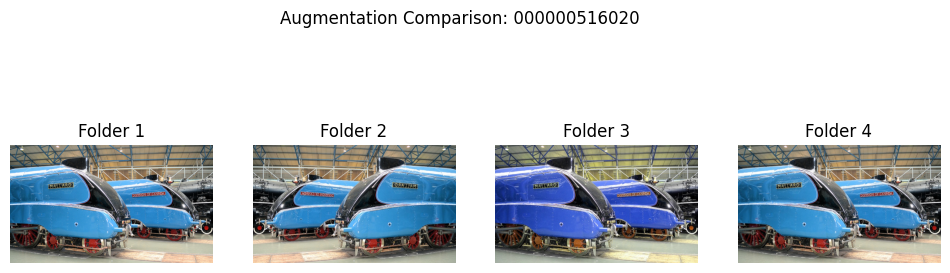

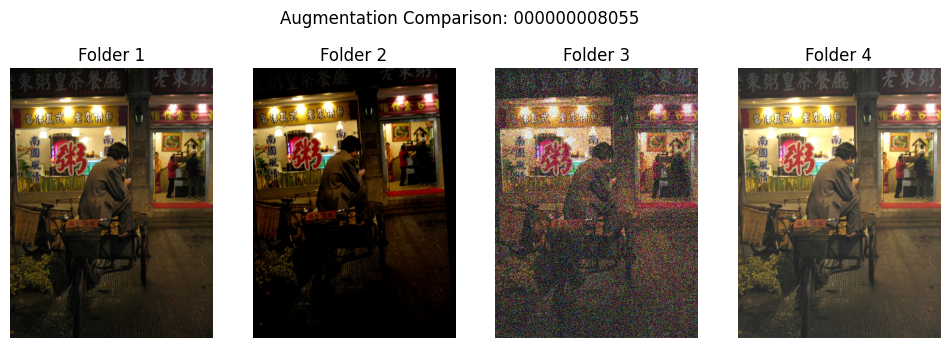

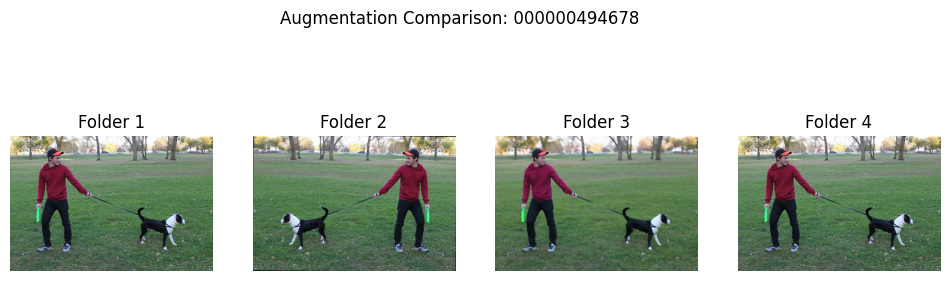

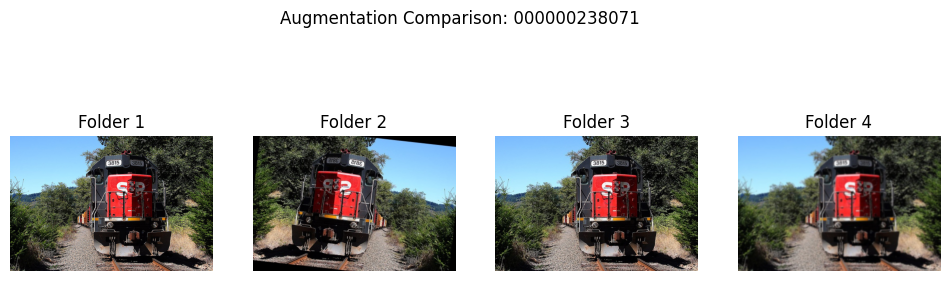

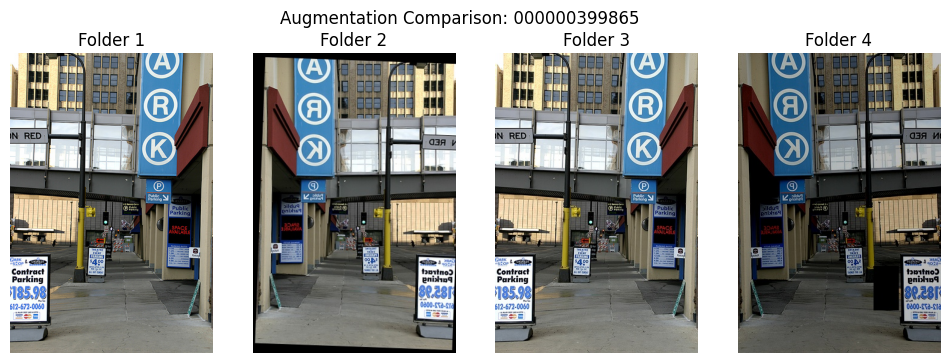

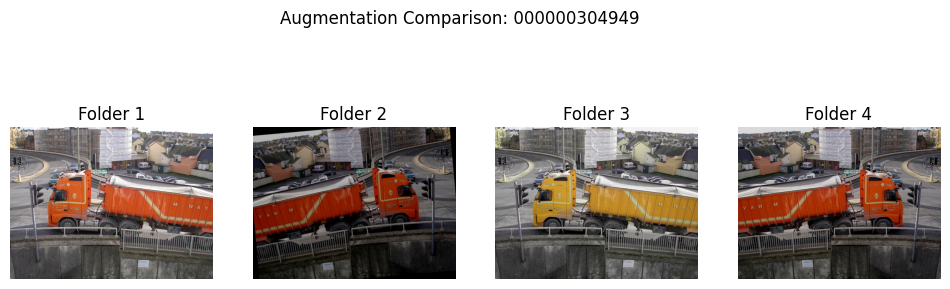

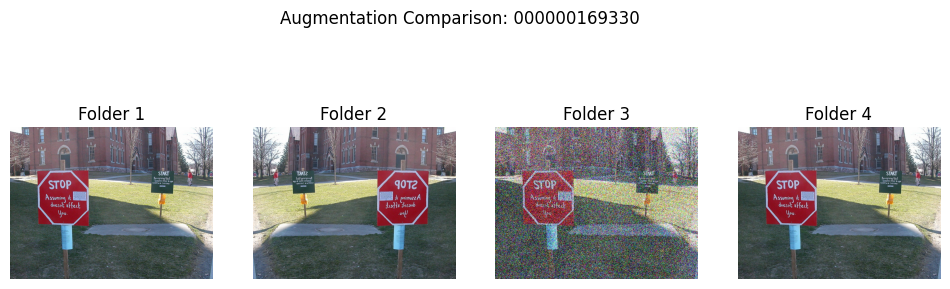

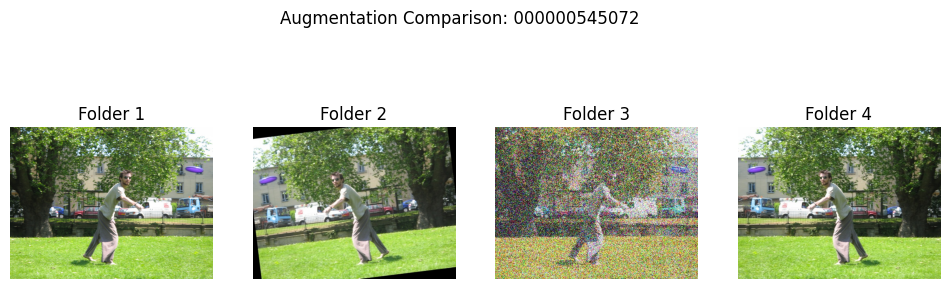

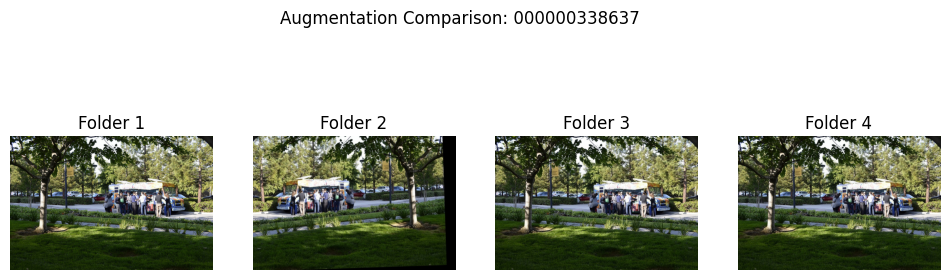

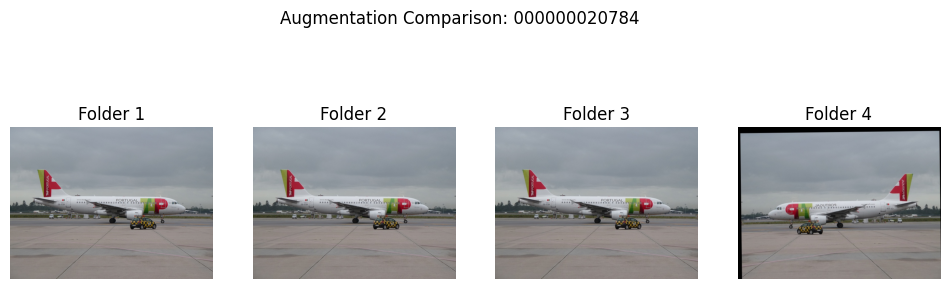

In [ ]:
from IPython.display import display
from PIL import Image
import matplotlib.pyplot as plt

for i, group in enumerate(image_sets):
    plt.figure(figsize=(12, 4))
    for j, img_path in enumerate(group):
        img = Image.open(img_path)
        plt.subplot(1, 4, j+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Folder {j+1}")
    plt.suptitle(f"Augmentation Comparison: {selected[i]}")
    plt.show()


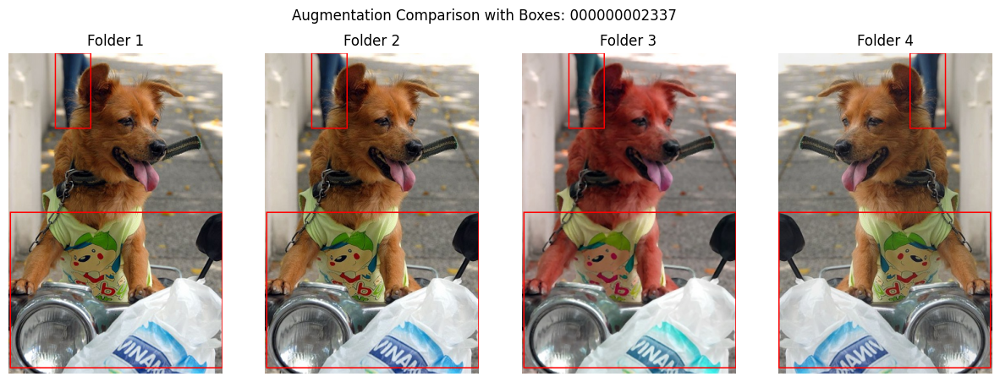

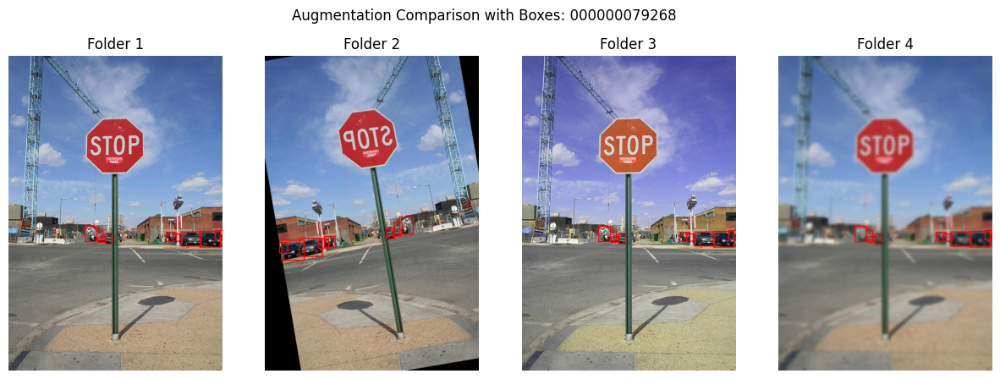

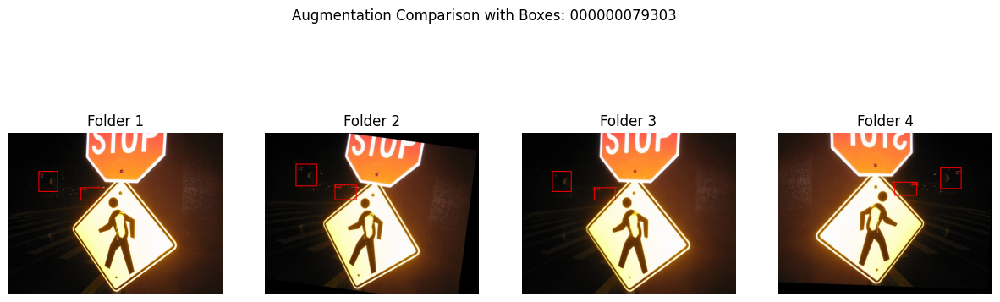

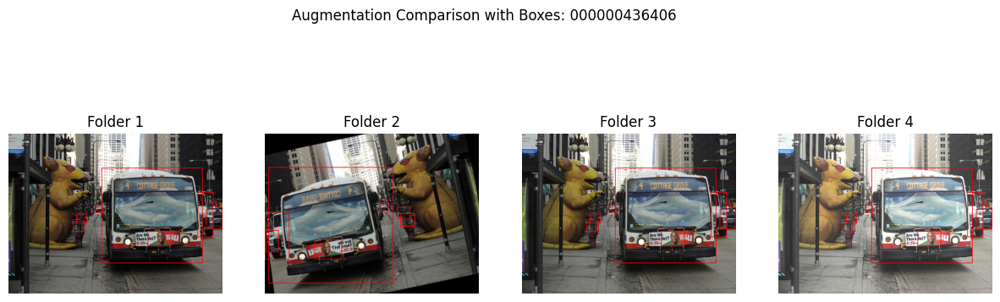

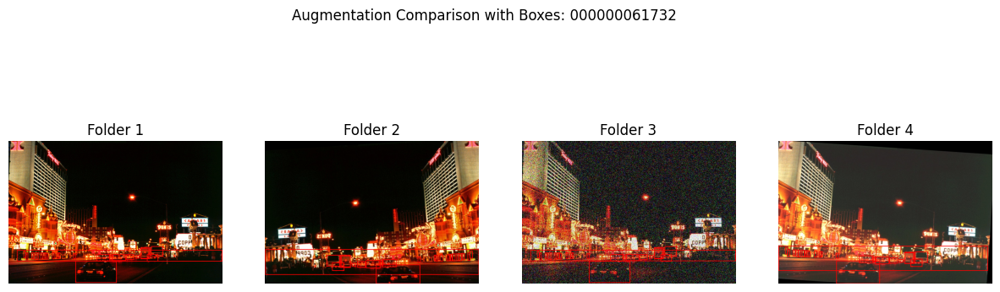

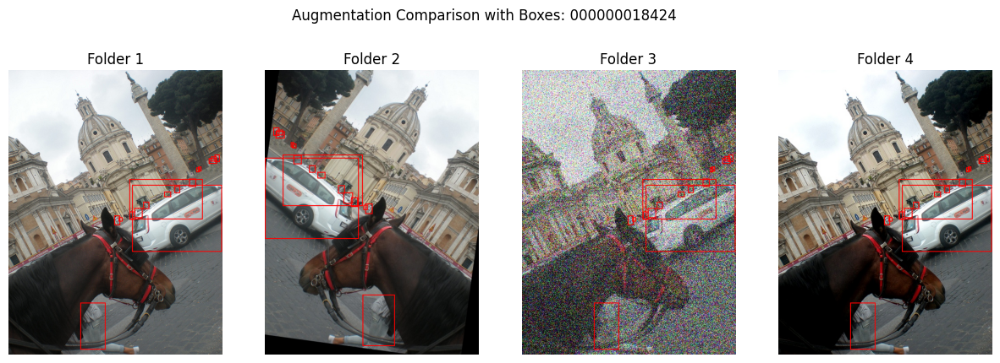

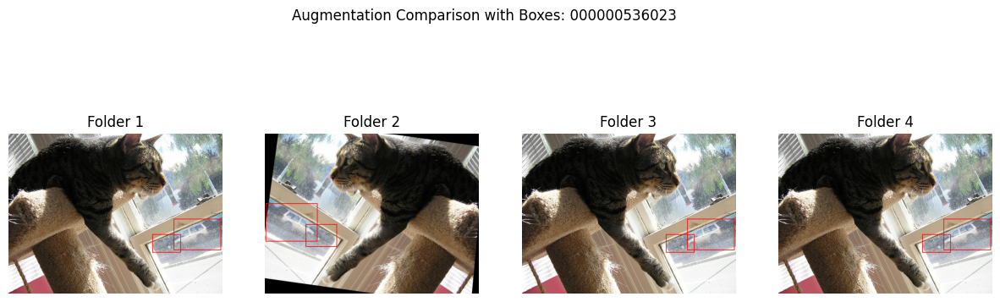

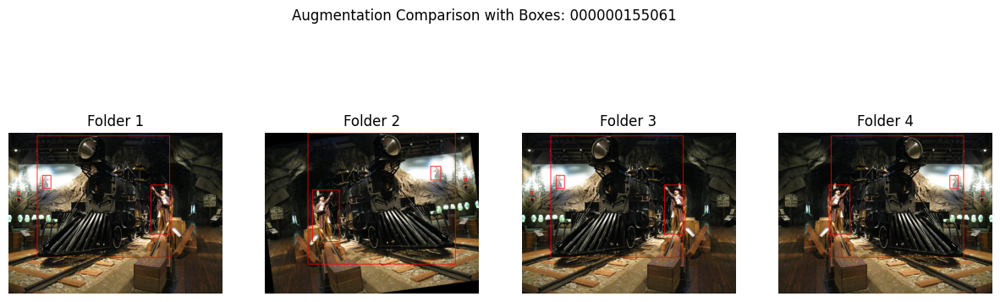

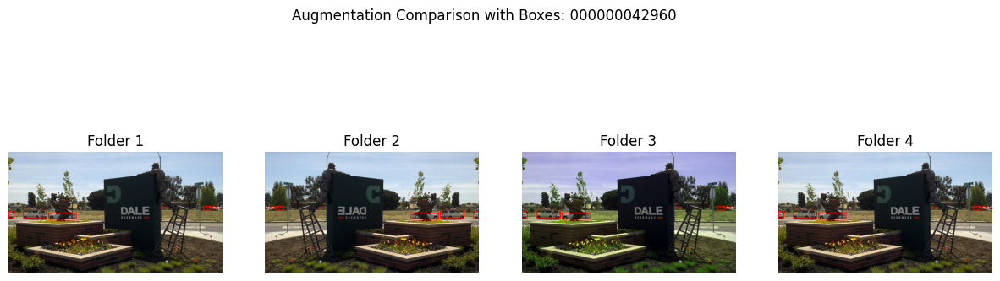

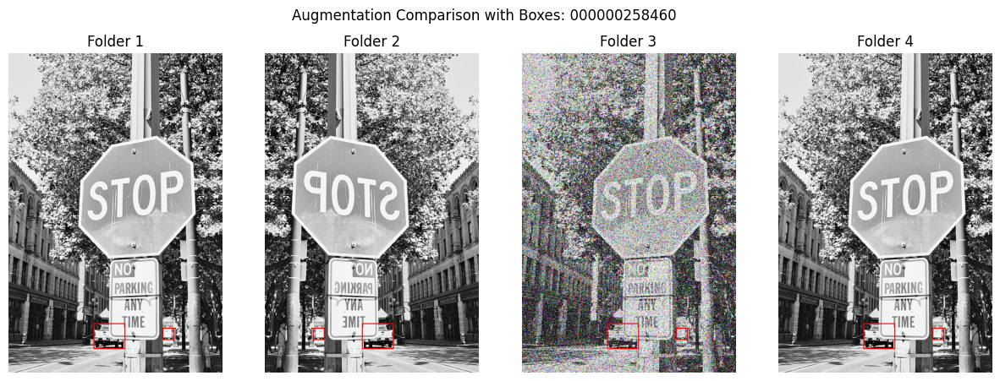

In [ ]:
import os
import random
from glob import glob
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# === Define image + label paths ===
image_folders = [
    "/content/working/dataset/images/train",
    "/content/working/dataset_aug/images/train",
    "/content/working/dataset_aug_2/images/train",
     "/content/working/dataset_aug_3/images/train",
]

label_folders = [
    "/content/working/dataset/labels/train",
    "/content/working/dataset_aug/labels/train",
    "/content/working/dataset_aug_2/labels/train",
    "/content/working/dataset_aug_3/labels/train",
]

# === Pick 10 random base names from dataset_aug (i.e., original basenames) ===
base_folder = image_folders[1]
all_images = glob(os.path.join(base_folder, "*_aug.jpg"))
basenames = [os.path.basename(f).replace("_aug.jpg", "") for f in all_images]
selected = random.sample(basenames, 10)

# === Group image and label paths ===
image_sets = []
label_sets = []

for base in selected:
    img_group = []
    lbl_group = []
    for i, folder in enumerate(image_folders):
        if i == 0:  # original folder
            img_path = os.path.join(folder, f"{base}.jpg")
            lbl_path = os.path.join(label_folders[i], f"{base}.txt")
        else:
            img_path = os.path.join(folder, f"{base}_aug.jpg")
            lbl_path = os.path.join(label_folders[i], f"{base}_aug.txt")

        img_group.append(img_path)
        lbl_group.append(lbl_path)
    image_sets.append(img_group)
    label_sets.append(lbl_group)

# === Helper to draw YOLO-format bounding boxes ===
def draw_yolo_boxes(image_path, label_path):
    image = Image.open(image_path).convert("RGB")
    draw = ImageDraw.Draw(image)
    w, h = image.size

    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) == 5:
                    class_id, x_center, y_center, width, height = map(float, parts)
                    # Convert from YOLO (normalized) to pixel coordinates
                    x_min = (x_center - width / 2) * w
                    y_min = (y_center - height / 2) * h
                    x_max = (x_center + width / 2) * w
                    y_max = (y_center + height / 2) * h
                    draw.rectangle([x_min, y_min, x_max, y_max], outline="red", width=2)
    else:
        print(f"Label file not found: {label_path}")
    return image

# === Plot images with bounding boxes ===
for i, (imgs, labels) in enumerate(zip(image_sets, label_sets)):
    plt.figure(figsize=(15, 5))
    for j, (img_path, lbl_path) in enumerate(zip(imgs, labels)):
        img = draw_yolo_boxes(img_path, lbl_path)
        plt.subplot(1, 4, j+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Folder {j+1}")
    plt.suptitle(f"Augmentation Comparison with Boxes: {selected[i]}")
    plt.show()


In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import shutil
from google.colab import files

# === 1. Create save directory ===
save_dir = "/content/augmentation_comparison_results"
os.makedirs(save_dir, exist_ok=True)

# === 2. Plot and save each comparison ===
for i, (imgs, labels) in enumerate(zip(image_sets, label_sets)):
    plt.figure(figsize=(15, 5))
    for j, (img_path, lbl_path) in enumerate(zip(imgs, labels)):
        img = draw_yolo_boxes(img_path, lbl_path)  # You should already have this function
        plt.subplot(1, len(imgs), j+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Folder {j+1}")
    plt.suptitle(f"Augmentation Comparison with Boxes: {selected[i]}")

    # Save the figure
    save_path = os.path.join(save_dir, f"comparison_{selected[i]}.png")
    plt.savefig(save_path, bbox_inches='tight', dpi=300)
    plt.close()  # Avoids display if you're saving many

# === 3. Zip the folder ===
shutil.make_archive("/content/augmentation_comparison_results", 'zip', save_dir)

# === 4. Download to local computer ===
files.download("/content/augmentation_comparison_results.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>